# Рынок заведений общественного питания Москвы

Презентация: https://vova.info/da/cafe.pdf 

## Описание проекта

Вы решили открыть небольшое кафе в Москве. Оно оригинальное — гостей должны обслуживать роботы. Проект многообещающий, но дорогой. Вместе с партнёрами вы решились обратиться к инвесторам. Их интересует текущее положение дел на рынке — сможете ли вы снискать популярность на долгое время, когда все зеваки насмотрятся на роботов-официантов?

Вы — гуру аналитики, и партнёры просят вас подготовить исследование рынка. У вас есть открытые данные о заведениях общественного питания в Москве.

## Инструкция по выполнению проекта

### Шаг №1. Загрузите данные и подготовьте их к анализу

Загрузите данные о заведениях общественного питания Москвы. Убедитесь, что тип данных в каждой колонке — правильный, а также отсутствуют пропущенные значения и дубликаты. При необходимости обработайте их.

Путь к файлу: /datasets/rest_data.csv. 

### [Шаг №2. Анализ данных](#2)

* [Исследуйте соотношение видов объектов общественного питания по количеству. Постройте график.](#2.1)
* [Исследуйте соотношение сетевых и несетевых заведений по количеству. Постройте график.](#2.2)
* [Для какого вида объекта общественного питания характерно сетевое распространение?](#2.3)
* [Что характерно для сетевых заведений: много заведений с небольшим числом посадочных мест в каждом или мало заведений с большим количеством посадочных мест?](#2.4)
* [Для каждого вида объекта общественного питания опишите среднее количество посадочных мест. Какой вид предоставляет в среднем самое большое количество посадочных мест? Постройте графики.](#2.5)
* [Выделите в отдельный столбец информацию об улице из столбца address .](#2.6)
* [Постройте график топ-10 улиц по количеству объектов общественного питания. Воспользуйтесь внешней информацией и ответьте на вопрос — в каких районах Москвы находятся эти улицы?](#2.7)
* [Найдите число улиц с одним объектом общественного питания. Воспользуйтесь внешней информацией и ответьте на вопрос — в каких районах Москвы находятся эти улицы?](#2.8)
* [Посмотрите на распределение количества посадочных мест для улиц с большим количеством объектов общественного питания. Какие закономерности можно выявить?](#2.9)

Сделайте общий вывод и дайте рекомендации о виде заведения, количестве посадочных мест, а также районе расположения. Прокомментируйте возможность развития сети.

### Шаг №3. Подготовка презентации

Подготовьте презентацию исследования для инвесторов. Для создания презентации используйте любой удобный инструмент, но отправить презентацию нужно обязательно в формате pdf. Приложите ссылку на презентацию в markdown-ячейке в формате:

Презентация: <ссылка на облачное хранилище с презентацией>

Следуйте принципам оформления из темы «Подготовка презентации».

Оформление: Задание выполните в Jupyter Notebook. Программный код заполните в ячейках типа code, текстовые пояснения — в ячейках типа markdown. Примените форматирование и заголовки.

## Описание данных

Таблица `rest_data`:
* object_name — название объекта общественного питания;
* chain — сетевой ресторан;
* object_type — тип объекта общественного питания;
* address — адрес;
* number — количество посадочных мест.

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import requests
import json
import io
from scipy import stats as st
from IPython.core.display import display, HTML
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()


pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', lambda x: '%.2f' % x)
pd.set_option('display.max_colwidth', -1)
sns.set_style("darkgrid")

In [2]:
# библиотека используемых самописных функций

def df_info(df):
    """вывод базовой инфы по датафрейму"""
    df.info()
    display(df.describe())
    display(df)
    
def normal_df(df):
    """приводим имена колонок к ниженему регистру, убираем пробелы и обрабатываем даты в колонках *_ts"""
    df.columns = df.columns.str.lower().str.replace(' ', '_')
    df.columns
    for col in df.columns:
        if col.endswith('_ts'):
            df[col] = pd.to_datetime(df[col])
            df[col+'_month'] = df[col].astype('datetime64[M]')
    return df

def print_min_max(series, label):
    """выводим минимум и максимум для Series"""
    print('{}: min={} max={}'.format(label, series.min(), series.max()))

def show_html_tag(tag, text):
    """выводим text внутри тэга tag"""
    display(HTML('<' + tag + '>'+text+'</'+tag+'>'))    

def scatter_plot_y(y, title, xlabel='', ylabel=''):
    """Вывод Series y в виде точечного графиком с X в виде порядкового номера"""

    plt.figure(figsize = (15, 2))
    ax = sns.scatterplot(x= range(0,len(y)), y = y, linewidth = 0)
    ax.set_title(title)
    ax.set(xlabel=xlabel, ylabel=ylabel)
    plt.show()    
    
def calc_proc(df, scr_column, dest_column):
    """ перевод абсолютных значений в колонке scr_column в долю и записываем в dest_column"""
    count_all = df[scr_column].sum()
    df[dest_column] = df[scr_column]/count_all
    return df    

def h_bar(df, x, y, xlabel, ylabel, xsize = 17, ysize = 5, title = '', s_format = '{}'):
    """ вывод горизонтального барплота с подписями значений
    df - датафрейм с данными
    x, y - соответсвующие параметры барплота
    xlabel, ylabel - подписи осей
    xsize, ysize - figsize
    title - заголовок графика
    s_format - форматная строка для вывода значений
    """

    fig, ax = plt.subplots(figsize=(xsize,ysize)) 
    sns.barplot(data = df, y=y, x=x, ax=ax, orient = 'h')
    for p in ax.patches:
        if str(p.get_width()) != 'nan':
            s_out = s_format.format(p.get_width())
            ax.text(p.get_width(), p.get_y()+.5, s_out)

    ax.set(xlabel=xlabel, ylabel=ylabel)
    ax.set_title(title)

    plt.show()

def h_bar_hue(df, x, y, hue, xlabel='', ylabel='', xsize = 17, ysize = 5, title = '', s_format = '{}'):
    """ вывод горизонтального барплота с hue и с подписями значений
    df - датафрейм с данными
    x, y, hue - соответствующие параметры барплота
    xlabel, ylabel - подписи осей
    xsize, ysize - figsize
    title - заголовок графика
    s_format - форматная строка для вывода значений
    !!!ВНИМАНИЕ! протестировано только когда hue имеет всего 2 значения!!!.
    """    
    fig, ax = plt.subplots(figsize=(xsize,ysize)) 
    sns.barplot(data = df, y=y, x=x, hue = hue, ax=ax, orient = 'h')
    for p in ax.patches:
        if str(p.get_width()) != 'nan':
            s_out = s_format.format(p.get_width())
            ax.text(p.get_width(), p.get_y()+0.25, s_out)

    ax.set(xlabel=xlabel, ylabel=ylabel)
    ax.set_title(title)
    plt.show()

def boxplot_h(df, x, y, xlabel='', ylabel='', xsize = 17, ysize = 5, title = '', xlim = None):
    """ вывод горизонтального боксплота
    df - датафрейм с данными
    x, y - соответствующие параметры боксплота
    xlabel, ylabel - подписи осей
    xsize, ysize - figsize
    title - заголовок графика
    xlim - соответствующий параметр ax     
    """    

    fig, ax = plt.subplots(figsize=(xsize,ysize))
    if xlim != None:
        ax.set(xlim=xlim)
    sns.boxplot( data = df, orient = 'h', x=x, y=y, ax=ax)
    ax.set(xlabel=xlabel, ylabel=ylabel)
    ax.set_title(title)
    plt.show()
    
def show_map(data, x='long', y='lat', xsize = 17, ysize = 20, hue=None, title=None):
    """ вывод точек на карте Москвы
    data - датафрейм с данными
    x, y, hue - соответствующие параметры скаттерплота
    xsize, ysize - figsize
    title - заголовок графика
    """    
    BBox = (37.35, 37.86, 55.56, 55.92)
    ruh_m = plt.imread('http://vova.info/da/map.png')
    fig, ax = plt.subplots(figsize = (xsize,ysize))
    ax.set_title(title)
    ax.set_xlim(BBox[0],BBox[1])
    ax.set_ylim(BBox[2],BBox[3])
    sns.scatterplot(data=data, x = x, y = y, zorder=1, alpha= .5, hue = hue, s=50, linewidth = 0)
    ax.imshow(ruh_m, zorder=0, extent = BBox, aspect= 'auto', interpolation='lanczos')
    ax.set(xlabel='', ylabel='')
    plt.show()

,id,object_name,chain,object_type,address,number,district,lat,long
0,151635,СМЕТАНА,нет,кафе,"город Москва, улица Егора Абакумова, дом 9",48,Ярославский район,55.88,37.71
1,77874,Родник,нет,кафе,"город Москва, улица Талалихина, дом 2/1, корпус 1",35,Таганский район,55.74,37.67
2,24309,Кафе «Академия»,нет,кафе,"город Москва, Абельмановская улица, дом 6",95,Таганский район,55.74,37.67
3,21894,ПИЦЦЕТОРИЯ,да,кафе,"город Москва, Абрамцевская улица, дом 1",40,район Лианозово,55.89,37.57
4,119365,Кафе «Вишневая метель»,нет,кафе,"город Москва, Абрамцевская улица, дом 9, корпус 1",50,район Лианозово,55.90,37.57
...,...,...,...,...,...,...,...,...,...
15361,222491,Кальянная «Мята Lounge»,да,кафе,"город Москва, Профсоюзная улица, дом 142, корпус 1, строение 1",40,район Тёплый Стан,55.63,37.51
15362,212216,Мята Lounge,да,кафе,"город Москва, Привольная улица, дом 11",56,район Выхино-Жулебино,55.70,37.84
15363,206341,Мята Lounge,да,кафе,"город Москва, Салтыковская улица, дом 7Г",100,район Новокосино,55.73,37.86
15364,213772,Тануки,да,ресторан,"город Москва, Осенний бульвар, дом 9",98,район Крылатское,55.76,37.41


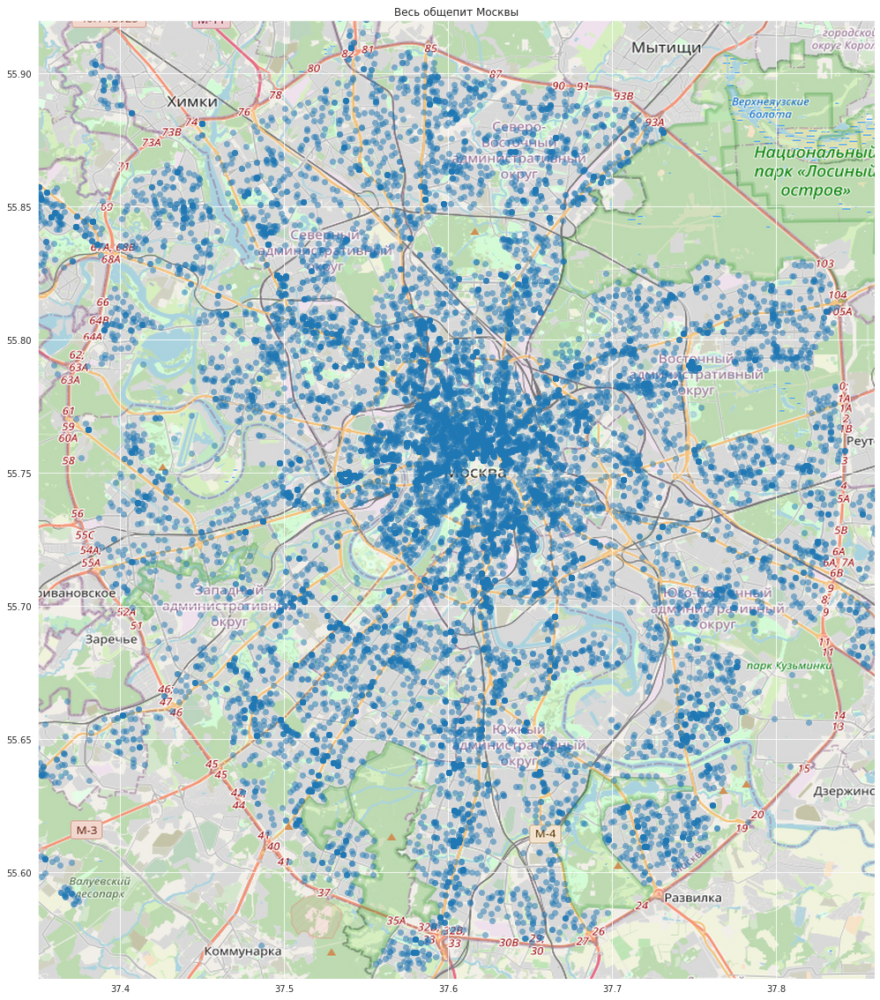

In [3]:
# делаем загрузку с разных путей в зависимости от того, где запущена тетрадка - локально или на сервере ЯП
root_local = 'datasets/' #путь к данным при локальном запуске
root_yp = '/datasets/' #путь к данным при запуске на сервере ЯП

username = ''
try:
    username = os.environ["USERNAME"]
except:
    pass

if(username == 'msn'): # локально
    root_path = root_local
else: # в тренажере
    root_path = root_yp

rest_df = pd.read_csv(root_path + 'rest_data.csv')

# файл с заранее подготовленными данными по адресам и районам, 
# создаётся ниже в процедуре generate_district_df() в самой последней ячейке тетрадки
district_url='http://vova.info/da/district_coord.csv'
s = requests.get(district_url).content
district_df = pd.read_csv(io.StringIO(s.decode('utf-8')))

def split_coord(row):    
    try:
        coords = row['coord'].split(' ')
        return float(coords[0]), float(coords[1]) 
    except:
        return None, None

# конечно, надо было в файлик записать уже расщеплённые координаты, но поздно...
district_df[['long', 'lat']] = district_df.apply(split_coord, axis=1, result_type = 'expand')

# обогащаем исходный датафрейм информацией о районах и координатах]
rest_df = rest_df.merge(district_df.filter(['address', 'district', 'lat', 'long']), on='address')
display(rest_df)
show_map(rest_df, title='Весь общепит Москвы')

## Первый взгляд на данные.

In [4]:
df_info(rest_df)
print('object_type = {}'.format(rest_df['object_type'].unique()))
print('chain = {}'.format(rest_df['chain'].unique()))

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15366 entries, 0 to 15365
Data columns (total 9 columns):
id             15366 non-null int64
object_name    15366 non-null object
chain          15366 non-null object
object_type    15366 non-null object
address        15366 non-null object
number         15366 non-null int64
district       14708 non-null object
lat            14708 non-null float64
long           14708 non-null float64
dtypes: float64(2), int64(2), object(5)
memory usage: 1.2+ MB


,id,number,lat,long
count,15366.00,15366.00,14708.00,14708.00
mean,119720.07,59.55,55.75,37.60
std,73036.13,74.74,0.08,0.11
min,838.00,0.00,55.47,37.15
25%,28524.00,12.00,55.70,37.54
50%,144974.50,40.00,55.75,37.61
75%,184262.25,80.00,55.79,37.66
max,223439.00,1700.00,56.02,37.95


,id,object_name,chain,object_type,address,number,district,lat,long
0,151635,СМЕТАНА,нет,кафе,"город Москва, улица Егора Абакумова, дом 9",48,Ярославский район,55.88,37.71
1,77874,Родник,нет,кафе,"город Москва, улица Талалихина, дом 2/1, корпус 1",35,Таганский район,55.74,37.67
2,24309,Кафе «Академия»,нет,кафе,"город Москва, Абельмановская улица, дом 6",95,Таганский район,55.74,37.67
3,21894,ПИЦЦЕТОРИЯ,да,кафе,"город Москва, Абрамцевская улица, дом 1",40,район Лианозово,55.89,37.57
4,119365,Кафе «Вишневая метель»,нет,кафе,"город Москва, Абрамцевская улица, дом 9, корпус 1",50,район Лианозово,55.90,37.57
...,...,...,...,...,...,...,...,...,...
15361,222491,Кальянная «Мята Lounge»,да,кафе,"город Москва, Профсоюзная улица, дом 142, корпус 1, строение 1",40,район Тёплый Стан,55.63,37.51
15362,212216,Мята Lounge,да,кафе,"город Москва, Привольная улица, дом 11",56,район Выхино-Жулебино,55.70,37.84
15363,206341,Мята Lounge,да,кафе,"город Москва, Салтыковская улица, дом 7Г",100,район Новокосино,55.73,37.86
15364,213772,Тануки,да,ресторан,"город Москва, Осенний бульвар, дом 9",98,район Крылатское,55.76,37.41


object_type = ['кафе' 'предприятие быстрого обслуживания' 'столовая' 'закусочная'
 'ресторан' 'кафетерий' 'буфет' 'бар' 'магазин (отдел кулинарии)']
chain = ['нет' 'да']


### Выводы
* К анализу представленно 15366 записей по заведениям общепита. 
* Пропущенных значений нет (кроме информации о районах, которую получали отдельно)
* в категориальных столбцах object_type и chain значения адекватные, без дублирования.

## Нормализация данных

### Обработка наименований заведений

In [5]:
n_chain_start = len(rest_df.query('chain == "да"').groupby('object_name'))
show_html_tag('h4', 'Число уникальных имён сетей до начала нормализации: {}'.format(n_chain_start))

In [6]:
# 1. регистр имени

# выберем сетевые заведения, сгруппируем их по имени и добавим столбец с именем в нижнем регистре
grouped_df = rest_df.query('chain == "да"').groupby('object_name').agg(count=('id', 'count'))\
                .reset_index().sort_values('count', ascending = False)
grouped_df['lover_name'] = grouped_df['object_name'].str.lower()

grouped_lower_df = grouped_df.groupby('lover_name').agg(name1=('object_name', 'min'), name2=('object_name', 'max'))\
                                .query('name1 != name2')

# у 117 сетей есть названия, отличющиеся только регистром. Ручной выбор правильного написания слишком трудоёмок, 
# поэтому сделаем проще - приведём все имена к нижнему регистру
rest_df['object_name'] = rest_df['object_name'].str.lower()
n_chain_lower = len(rest_df.query('chain == "да"').groupby('object_name'))
show_html_tag('h4', 'Число уникальных имён сетей после приведения к нижнему регистру: {}'.format(n_chain_lower))

In [7]:
# 2. неявные дубли из-за слов типа кафе, ресторан, кавычек и т.д.
bad_words = ['кафе', 'ресторан', 'закусочная', 'кофейня', 'пиццерия', 'бар', 'предприятие быстрого обслуживания', '"', '«', '»']

def clear_one_name(row):
    new_name = row['object_name']

    # удаляем "плохие" слова
    for bad_word in bad_words:
        new_name = new_name.replace(bad_word, '')
    
    # заменяем двойные пробелы на одинарные (могли образоваться после удаления слова окружённого пробелами)
    while new_name.find('  ') != -1:
        new_name = new_name.replace('  ', ' ')
    
    # удаляем начальные и конечные пробелы
    new_name = new_name.strip()
    return new_name

rest_df['object_name'] = rest_df.apply(clear_one_name, axis=1)

n_chain_not_bad = len(rest_df.query('chain == "да"').groupby('object_name'))
show_html_tag('h4', 'Число уникальных имён сетей после удаления незначащих слов и символов: {}'.format(n_chain_not_bad))

In [8]:
# 3. ищем латинские символы в именах. это подозрительно
def lat_symbols(row):
    name = row['object_name']
    
    match = re.search('[a-zA-Z]', name)
    
    return 'да' if match else 'нет'

rest_df['latin'] = rest_df.apply(lat_symbols, axis=1)

# pd.set_option('display.max_rows', None) #при анализе данных выводил всю таблицу
# display(rest_df.query('latin == "да" and chain == "да"').groupby('object_name').agg(count=('id', 'count'))\
#                  .reset_index().sort_values('count', ascending = False).head(150))
# pd.set_option('display.max_rows', 10)

# проводим преобразования типа  "kfc киевская" в "kfc" и "subway" в "сабвей"
like_dict_replace = { # ключ - подстрока, вхождение которой ищем, значение - то, на что меняется вся строка
    'kfc': 'kfc',
    'макдоналдс': 'макдоналдс',
    'subway': 'сабвей',
    'сабвей': 'сабвей',
    'starbucks': 'старбакс',
    'старбакс': 'старбакс',
    'мята lounge': 'мята lounge',
    'travelers coffe': 'travelers coffee',
    'пицца pomodoro': 'пицца pomodoro',
    'fridays': 'tgi fridays',
    'бургер кинг': 'бургер кинг',
    'burger king': 'бургер кинг',
    'баскин роббинс': 'баскин роббинс',
    'tutti frutti': 'tutti frutti',
    'стардогs': 'стардогs',
    'суши wok': 'суши wok',
    'кофе хаус': 'кофе хаус',
    'кофе-хаус': 'кофе хаус',
    'чайхона №1': 'чайхона №1',
    'крошка картошка': 'крошка картошка',
    'теремок': 'теремок',
    'милти': 'милти',
    'му-му': 'му-му',
    'караваевы': 'кулинарная лавка братьев караваевых',
    'андерсон': 'андерсон',
    'патио': 'иль патио',
    'алло пицца': 'алло пицца',
    'гудман': 'стейк хаус гудман',
    'нияма': 'нияма',
    'dunkin donuts': 'данкин донатс',
    'московская сеть кальянных': 'московская сеть кальянных',
    'ванвок': 'ванвок',
    'домино': 'домино\'с пицца',
    'магбургер': 'магбургер',
    'в&в бургер': 'в&в бургер',
    'маки-маки': 'маки-маки',
    'maki maki': 'маки-маки',
    'burger club': 'бургер клаб',
    'торро гриль': 'торро гриль',
    'wokker': 'воккер',
    'суши вок': 'суши wok',
    'бенто wok': 'бенто wok',
    'папа джонс': 'папа джонс',
    'coffeeshop': 'coffeeshop company',
    'старина миллер': 'старина миллер',
    'урюк': 'урюк',
    'прайм': 'прайм стар',
    'бир хаус': 'бир хаус',
    'пилзнер': 'пилзнер',
    'штолле': 'штолле',
    'американ сити пицца': 'американ сити пицца',
} 
def apply_like_dict(row):
    name = row['object_name']
    
    for k, v in like_dict_replace.items():
        if name.find(k)!= -1: # если нашли ключ из словаря
            name = v          # то меняем на значение из словаря
    
    return name

rest_df['object_name'] = rest_df.apply(apply_like_dict, axis=1)

n_chain_not_bad = len(rest_df.query('chain == "да"').groupby('object_name'))
show_html_tag('h4', 
       'Число уникальных имён сетей после обработки транслита и филиалов: {}'.format(n_chain_not_bad))

#### Вывод
* Путём нормализации имён (приведение к одному регистру, удаления незначащих слов, обработка филиалов), число уникальных сетей удалось уменьшить с 724 до 319


### Проверим адекватность типа заведения для крупных сетей

In [9]:
# min и max использую для выявления различных типов заведения внутри одной сети
grouped_df = rest_df.query('chain == "да"').groupby('object_name').agg(
                    count=('id', 'count'), type1=('object_type', 'min'), type2=('object_type', 'max')\
                ).reset_index().sort_values('count', ascending = False)
display(grouped_df.head(10))

,object_name,count,type1,type2
20,kfc,188,закусочная,ресторан
306,шоколадница,183,бар,ресторан
174,макдоналдс,173,кафе,ресторан
74,бургер кинг,159,бар,ресторан
270,теремок,111,буфет,ресторан
118,домино'с пицца,99,закусочная,ресторан
160,крошка картошка,96,буфет,ресторан
257,суши wok,90,бар,предприятие быстрого обслуживания
184,милти,81,буфет,ресторан
251,старбакс,69,кафе,ресторан


#### Вывод
* У в рамках одной сети присутствуют заведения разного типа. Брать на себя ответственность за их нормализацию я не могу.

### Проверим дубли двух типов - несколько заведений одной сети по одному адресу и просто множество заведений по одному адресу

In [10]:
display(rest_df.groupby(['object_name', 'address']).agg(
                                count=('id', 'count'), min_number=('number', 'min'), max_number=('number', 'max')
                                                        ).query('count>2').sort_values('count'))
display(rest_df.groupby(['address']).agg(
                                count=('id', 'count'), min_number=('number', 'min'), max_number=('number', 'max')
                                                        ).query('count>2').sort_values('count'))

count  \
object_name                          address                                                                   
центр павла слободкина               город Москва, улица Арбат, дом 48, строение 1                     3       
                                     город Москва, Большая Семёновская улица, дом 16                   3       
                                     город Москва, Новочеркасский бульвар, дом 57, корпус 1            3       
                                     город Москва, проспект Вернадского, дом 6                         3       
                                     город Москва, улица Трофимова, владение 36                        3       
одиссей+                             город Москва, улица Барклая, дом 8                                3       
kfc                                  город Москва, площадь Киевского Вокзала, дом 2                    3       
                                     город Москва, проспект Мира, дом 211, корпус 2                    3       
комбинат питания мгту им.н.э.баумана город Москва, Бригадирский переулок, дом 3-5                      3       
шаурма                               город Москва, Свободный проспект, дом 33А                         3       
каменев василий владимирович         город Москва, улица Сущёвский Вал, дом 5, строение 1              3       
буфет                                город Москва, Пятницкое шоссе, дом 18                             4       
столовая при мгу                     город Москва, территория Ленинские Горы, дом 1                    4       
пунк питания                         город Москва, Большая Черкизовская улица, дом 125                 4       
общественное питание                 город Москва, Павелецкая площадь, дом 1                           4       
каменев василий владимирович         город Москва, улица Сущёвский Вал, дом 5, строение 5              4       
экспомил                             город Москва, Краснопресненская набережная, дом 14, сооружение 1  4       
бистро                               город Москва, проспект Вернадского, дом 86Б, строение 1           4       
                                     город Москва, улица Улофа Пальме, дом 5, строение 1               4       
lift                                 город Москва, Багратионовский проезд, дом 7, корпус 3             5       
павильон кукуруза                    город Москва, Люблинская улица, дом 153                           5       
гацоева анжела камалдиновна          город Москва, улица Сущёвский Вал, дом 5, строение 5              5       
                                     город Москва, Тихорецкий бульвар, владение 1, строение 1          6       
lift                                 город Москва, Багратионовский проезд, дом 7, корпус 1             7       
                                     город Москва, Береговой проезд, дом 5А, корпус 1                  7       
лиор                                 город Москва, Шарикоподшипниковская улица, дом 13, строение 3     9       
                                     город Москва, Люблинская улица, дом 112, строение 3               10      
                                     город Москва, 1-я Останкинская улица, дом 55                      10      
комбинат питания мгту им.н.э.баумана город Москва, 2-я Бауманская улица, дом 5, строение 1             11      

                                                                                                       min_number  \
object_name                          address                                                                        
центр павла слободкина               город Москва, улица Арбат, дом 48, строение 1                     10           
                                     город Москва, Большая Семёновская улица, дом 16                   5            
                                     город Москва, Новочеркасский бульвар, дом 57, корпус 1            0            
                                     город Мо

,count,min_number,max_number
address,,,
"Николоямская улица, дом 28/60, строение 1",3,40,90
"город Москва, Страстной бульвар, дом 2",3,20,60
"город Москва, Судостроительная улица, дом 23, корпус 1",3,0,40
"город Москва, Сходненская улица, дом 44/17",3,0,2
"город Москва, Таганская улица, дом 29, строение 1",3,23,98
...,...,...,...
"город Москва, площадь Киевского Вокзала, дом 2",48,0,300
"город Москва, Кировоградская улица, дом 13А",53,0,250
"город Москва, проспект Мира, дом 211, корпус 2",60,10,250


#### Вывод
* Предполагаю, что дублей нет. По крайней мере таких, которые можно вычислить автоматизировано, без разведки на местности.
* По одному адресу адресу бывает до 11 заведений с одним именем, но все они объяснимы - это какие-то крупные, хорошо проходимые места - ВУЗы, ТЦ, рынки
* Аналогично, и без группировки по имени, а только по адресу, мы видим только крупные объекты с большой посещаемостью.
* Единственное место, которое вызвало у меня большие подозрения, это `Люблинская улица, дом 112, строение 3` - судя по карте, там не могло быть много заведений. Но рядом по адресу `Люблинская улица, 112Ac1` расположен рынок, отсутствующий в нашем списке объектов, в котором находится множество точек питания, видимых даже на панормамах Яндекса. Вероятнее всего, произошёл сбой в адресной информации или просто изменился адрес объекта.

### Анализ числа посадочных мест

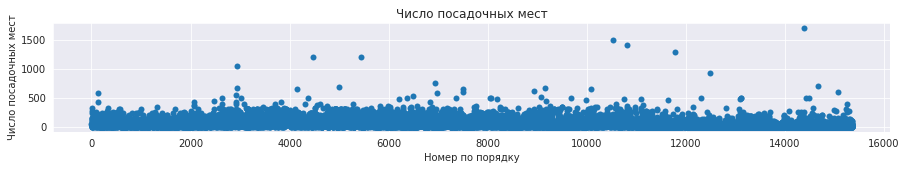

,id,object_name,chain,object_type,address,number,district,lat,long,latin
2933,26560,альфа,нет,ресторан,"город Москва, Измайловское шоссе, дом 71, корпус А",1040,район Измайлово,55.79,37.75,нет
4478,27026,рум сервис,нет,ресторан,"город Москва, площадь Европы, дом 2",1200,район Дорогомилово,55.74,37.57,нет
5439,27024,рум сервис,нет,ресторан,"город Москва, Кутузовский проспект, дом 2/1, строение 1",1200,район Дорогомилово,55.75,37.57,нет
11782,19719,комбинат питания управление академсервис,нет,столовая,"город Москва, проспект Вернадского, дом 84, строение 1",1288,район Тропарёво-Никулино,55.67,37.48,нет
10806,27750,столовая-буфет,нет,столовая,"город Москва, улица Волхонка, дом 15",1400,район Хамовники,55.74,37.61,нет
10524,80291,банкетный зал шелк,нет,ресторан,"город Москва, Большой Саввинский переулок, дом 12, строение 10Г",1500,район Хамовники,55.73,37.56,нет
14389,199696,arena by soho family,нет,бар,"город Москва, Кутузовский проспект, дом 36, строение 11",1700,район Дорогомилово,55.74,37.53,да


In [11]:
scatter_plot_y(rest_df['number'], title = 'Число посадочных мест', xlabel='Номер по порядку', ylabel='Число посадочных мест')
rest_df.query('number > 1000').sort_values('number')

#### Вывод
* Представляется, что число посадочных мест указано адекватное. Все подозрительные места с большим числом посадочных мест объяснимы - это крупные гостиницы, банкетные залы, ночные клубы и т.д.
* Все большие (1000+ посадочных мест) заведения несетевые

### Общие выводы по предобработке
* Путём нормализации имён (приведение к одному регистру, удаления незначащих слов, обработка филиалов), число уникальных сетей удалось уменьшить с 724 до 319
* В рамках одной сети есть заведения различных типов. Оставил как есть.
* Дубли в записях не выявлены.


<a id="2"></a>
## Анализ данных

<a id="2.1"></a>
### Соотношение видов объектов общественного питания по количеству.

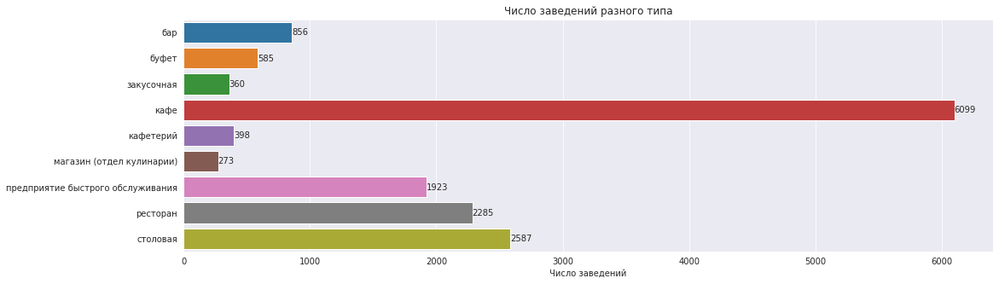

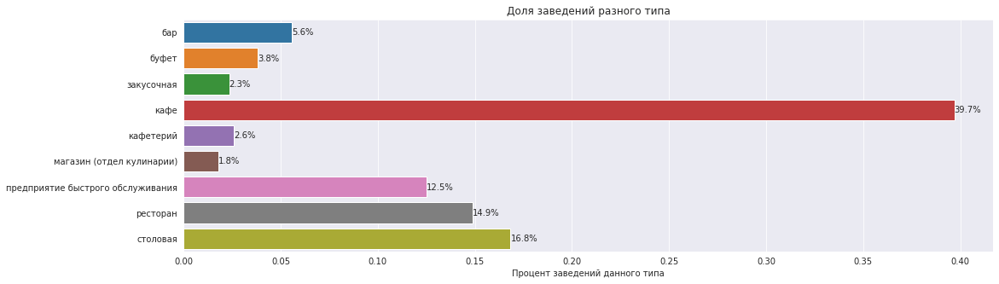

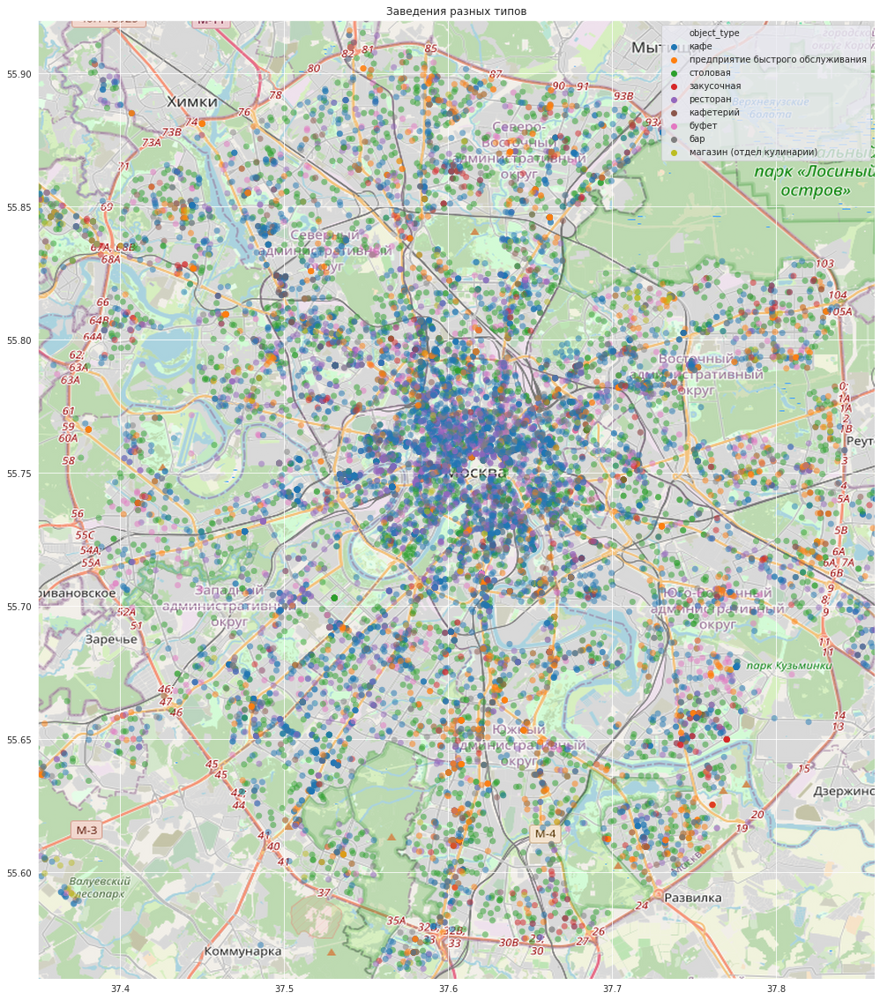

In [12]:
grouped_df = rest_df.groupby('object_type').agg(count=('id','count')).reset_index()

h_bar(df = grouped_df, x='count', y='object_type', xlabel='Число заведений', ylabel='', 
              title = 'Число заведений разного типа', s_format='{:.0f}')

h_bar(df = calc_proc(grouped_df, 'count', 'proc'), 
          x='proc', y='object_type', xlabel='Процент заведений данного типа', ylabel='', 
          title = 'Доля заведений разного типа', s_format='{:.1%}')
show_map(rest_df, hue = 'object_type', title='Заведения разных типов')

#### Вывод
* Наиболее распространённый тип заведений - кафе (6099 шт, 40%), что более чем в 2 раза превышает число столовых (2587 шт, 17%), которые на втором месте по популярности. 
* Самые редкие - отделы кулинарии в магазинах (273 шт, 1.8%) и закусочные (360 шт, 2.3%).
* Бары концентрируются ближе к центру, а столовые в основном на периферии.

<a id="2.2"></a>
### Соотношение сетевых и несетевых заведений по количеству.

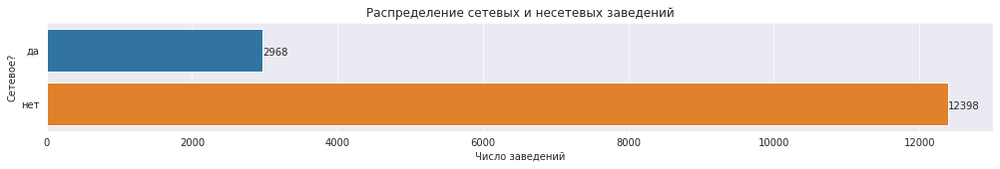

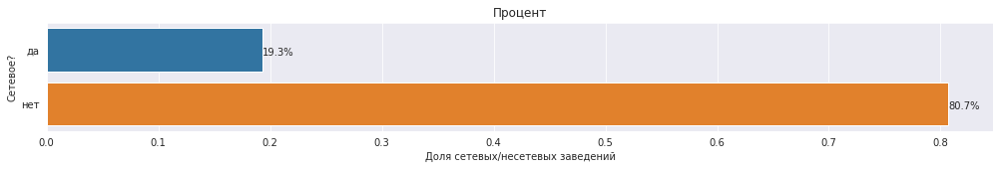

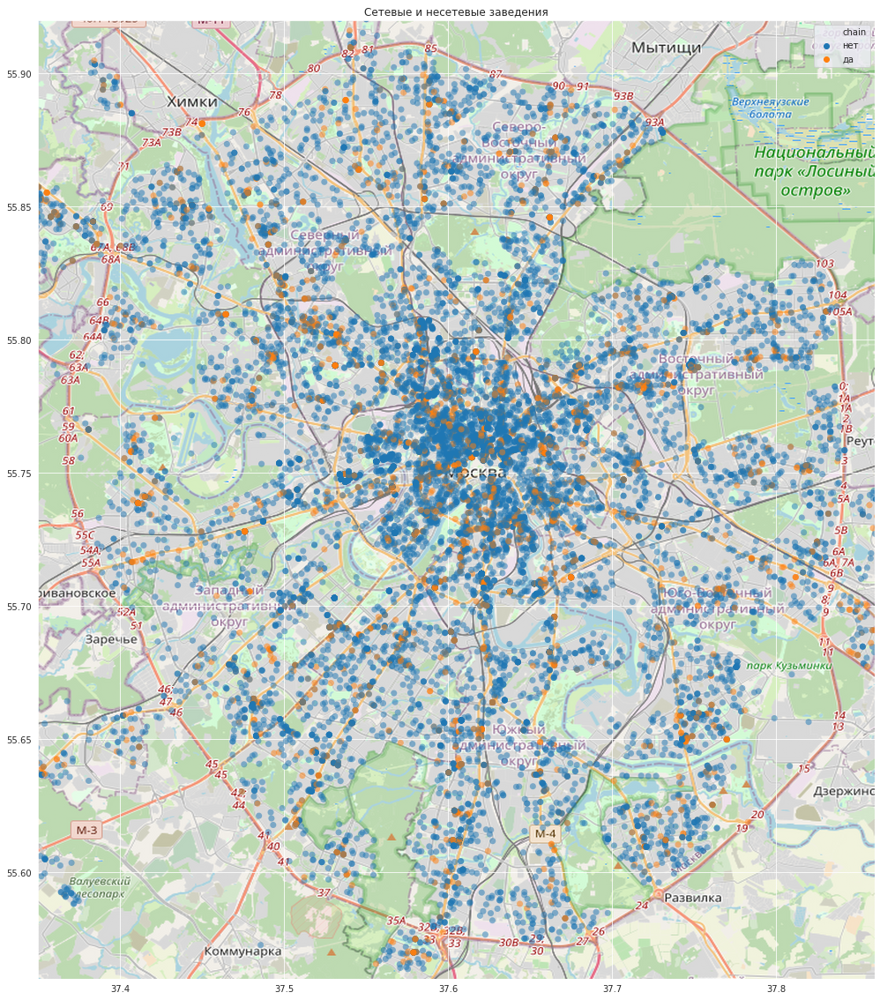

In [13]:
grouped_df = rest_df.groupby('chain').agg(count=('id','count')).reset_index()
h_bar(df = grouped_df, x='count', y='chain', xlabel='Число заведений', ylabel='Сетевое?', ysize = 2,
             title = 'Распределение сетевых и несетевых заведений', s_format='{:.0f}')

h_bar(df = calc_proc(grouped_df, 'count', 'proc'), 
          x='proc', y='chain', xlabel='Доля сетевых/несетевых заведений', ylabel='Сетевое?', ysize = 2,
          title = 'Процент', s_format='{:.1%}')
show_map(rest_df.query('lat==lat and long==long'), hue = 'chain', title='Сетевые и несетевые заведения')

#### Вывод
* Сетевых заведений в 4 раза меньше, чем несетевых (19% vs 81%)
* Соотношение сетевых/несетевых заведений тем ниже, чем дальше от центра

<a id="2.3"></a>
### Для какого вида объекта общественного питания характерно сетевое распространение?

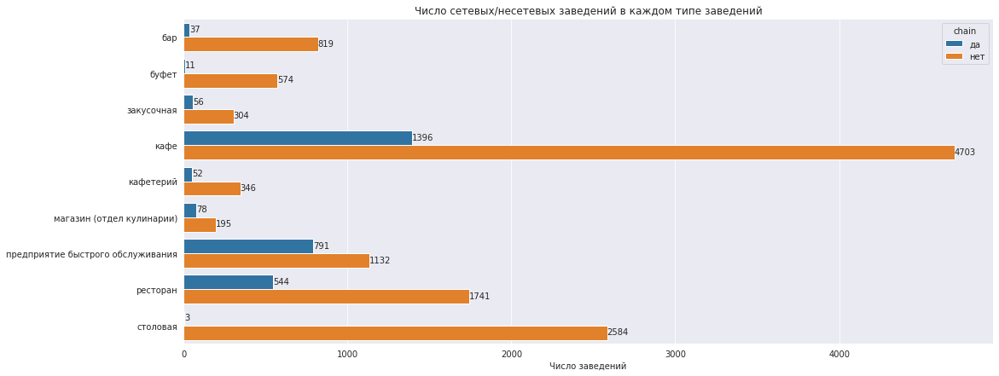

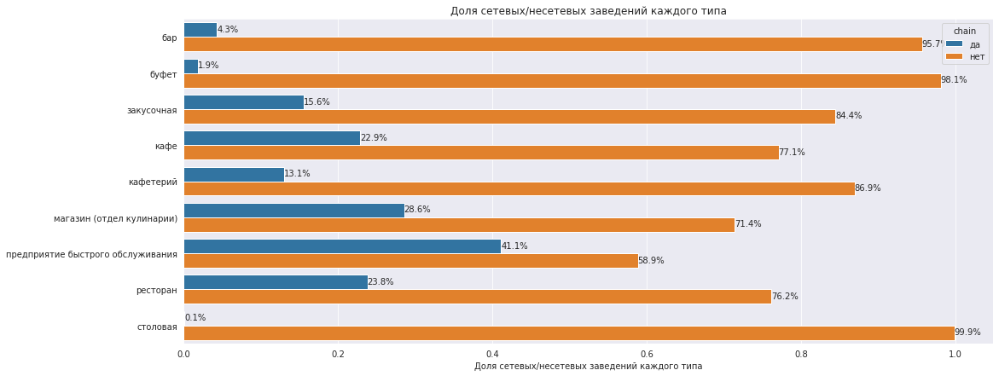

In [14]:
grouped_df = rest_df.groupby(['object_type','chain']).agg(count=('id','count'))
# вычисляем процент внутри каждой группы
proc_df = rest_df.groupby(['object_type']).agg(count=('id','count'))
grouped_df['proc'] = grouped_df.div(proc_df, level='object_type')['count']
grouped_df = grouped_df.reset_index()

h_bar_hue(df = grouped_df, x='count', y='object_type', hue = 'chain', xlabel='Число заведений', ysize = 7, 
              title = 'Число сетевых/несетевых заведений в каждом типе заведений', s_format='{:.0f}')
h_bar_hue(df = grouped_df, x='proc', y='object_type', hue = 'chain', xlabel='Доля сетевых/несетевых заведений каждого типа', 
           ysize = 7, title = 'Доля сетевых/несетевых заведений каждого типа', s_format='{:.1%}')

#### Вывод
* Чаще всего сетевые заведения встречаются среди предприятий быстрого обслуживания (41%) и отделов кулинарии в магазинах (28%)
* Реже всего среди столовых (0.1%) и буфетов (менее 2%).

<a id="2.4"></a>
### Что характерно для сетевых заведений: много заведений с небольшим числом посадочных мест в каждом или мало заведений с большим количеством посадочных мест?

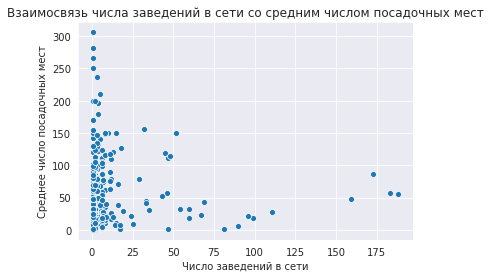

In [15]:
grouped_df = rest_df.query('chain == "да"').groupby('object_name').agg(n_rest = ('id','count'), n_seat = ('number', 'mean'))
ax = sns.scatterplot(x="n_rest", y="n_seat", data=grouped_df)
ax.set(xlabel='Число заведений в сети', ylabel='Среднее число посадочных мест')
ax.set_title('Взаимосвязь числа заведений в сети со средним числом посадочных мест')
plt.show()

#### Вывод
* В очень крупных (150+ точек) сетях среднее заведение имеет 50-100 посадочных мест.
* В крупных (50-125 точек) сетях, характерны заведения до 50 посадочных мест.
* В средних сетях (25-50 точек) число типичное заведение имеет уже до 150 посадочных мест.
* В малых сетях (< 25 точек), диапазон типичного заведения увеличивается до 300 посадочных мест, но всё же более характерным значением является до 150.
* В общем можно сказать, что характерный размер сети до 25 точек и средний размер заведения до 150 посадочных мест.

<a id="2.5"></a>
### Среднее количество посадочных мест в разрезе видов заведений.

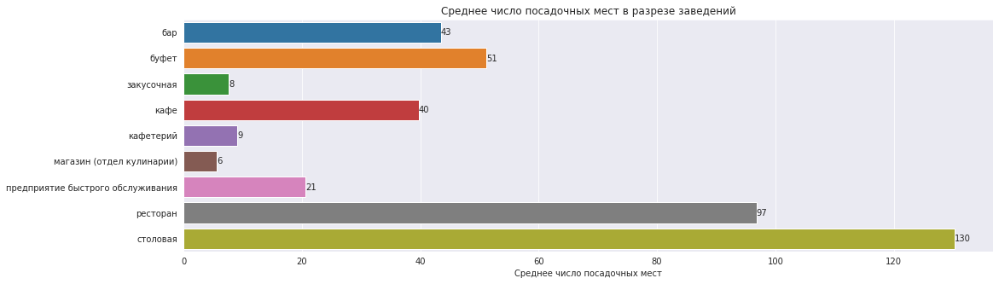

In [16]:
grouped_df = rest_df.groupby('object_type').agg( n_seat = ('number', 'mean')).reset_index()
h_bar(df = grouped_df, x='n_seat', y='object_type', xlabel='Среднее число посадочных мест', ylabel='', 
             title = 'Среднее число посадочных мест в разрезе заведений', s_format='{:.0f}')

#### Вывод
* Ожидаемо, максимальное число посадочных мест в столовых и ресторанах, а минимальное в отделах кулинарии и закусочных. Но это не точно, т.к. есть сомнения в чистоте классификации заведений

<a id="2.6"></a>
### Выделение в отдельный столбец информацию об улице из столбца address

In [17]:
streets_str = ['улица','проспект','шоссе','проезд','бульвар','переулок','набережная','площадь','вал','аллея', 'квартал',\
               'просек', 'тупик', 'город Зеленоград', 'линия', 'микрорайон Северное Чертаново', 'поселение', 'посёлок Акулово',\
               'километр Московской Кольцевой Автодороги', 'город Троицк', 'территория Ленинские Горы', 'город Московский']

def extract_street(address):
    for address_part in address.split(','):
        for streets_str_one in streets_str:
            if address_part.find(streets_str_one) != -1:
                return address_part.strip()



In [18]:
rest_df['street'] = rest_df['address'].apply(extract_street)
print('Число адресов с невыделенной улицей = {}'.format(len(rest_df.query('street != street'))))

Число адресов с невыделенной улицей = 0


#### Вывод
* Существуют адреса, у которых нет улиц в традиционном смысле этого слова. Это характерно для объектов, расположенных в Зеленограде, Северном Чертаново, Троицке и различных поселениях и посёлках. А так же на МКАДе. 
* При этом, в некоторых городах (например, Зеленограде), есть объекты и с улицами. Но для единообразия их так же отнесём просто к населённому пункту.

<a id="2.7"></a>
### Топ-10 улиц по количеству объектов общественного питания.

,street,n_point
0,город Зеленоград,232
1,проспект Мира,204
2,Профсоюзная улица,183
3,Ленинградский проспект,173
4,Пресненская набережная,167
5,Варшавское шоссе,164
6,Ленинский проспект,148
7,поселение Сосенское,139
8,проспект Вернадского,132
9,Кутузовский проспект,114


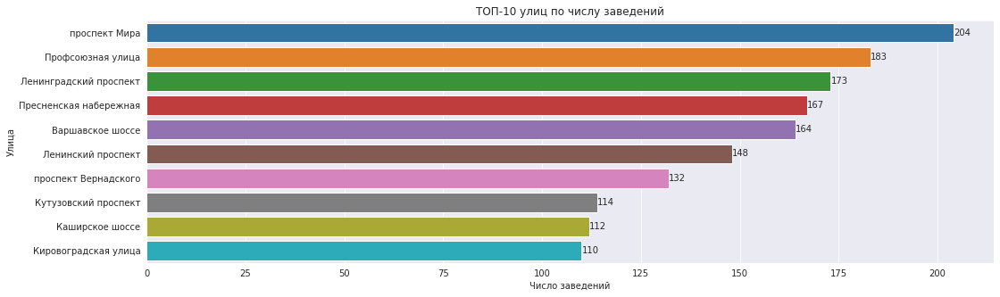

,count
district,
Пресненский район,167
район Чертаново Центральное,92
район Тропарёво-Никулино,88
район Аэропорт,65
Обручевский район,64
Мещанский район,63
район Свиблово,62
район Дорогомилово,61
район Нагатино-Садовники,57


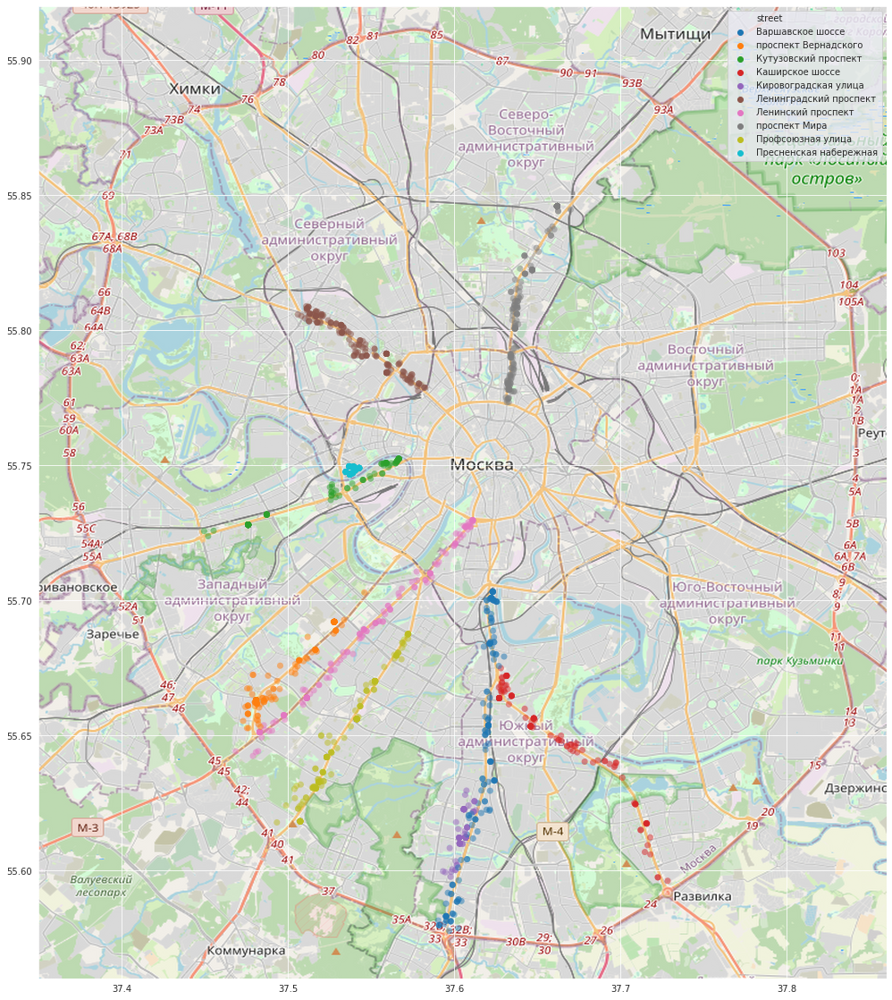

In [19]:
grouped_df = rest_df.groupby('street').agg(n_point=('id', 'count')).nlargest(12, 'n_point').reset_index()
show_html_tag('h4', 'TOP10 улиц и число заведений в них')
display(grouped_df)

# отбросим пригород
bad_street = ['город Зеленоград', 'поселение Сосенское']
h_bar(df = grouped_df.query('street not in @bad_street'), x='n_point', y='street', xlabel='Число заведений', ylabel='Улица', 
             title = 'ТОП-10 улиц по числу заведений', s_format='{:.0f}')

show_html_tag('h4', 'Список районов, через которые проходят улицы из TOP10 и число заведений в них')
top10_street = grouped_df.query('street not in @bad_street')['street'].tolist()

display(rest_df.query('street in @top10_street').groupby('district').agg(count=('id','count'))
                                                        .sort_values('count', ascending=False))
show_map(data = rest_df.query('street in @top10_street'), hue = 'street')

#### Вывод
* Топовые улицы по числу заведений - Проспект Мира, Профсоюзная, Ленинградский проспект
* Все улицы из TOP10 находятся за пределами Садового кольца. Видимо, это связано с тем, что внутри Садового улицы короткие и из-за этого у них нет шансов попасть в TOP.
* Сам вопрос "через какие районы эти улицы проходят" в контексте исследования абсолютно бессмысленный и нелогичный, но раз задали - ответил. Я бы его заменил на "какие районы входят в TOP10 по числу заведений" и ответ на него получить по моим данным легко - группировка по полю district, nlargest

<a id="2.8"></a>
### Улицы с одним объектом общественного питания.

,street,n_point,district,lat,long
2,1-й Балтийский переулок,1,район Аэропорт,55.81,37.52
3,1-й Басманный переулок,1,Красносельский район,55.77,37.66
4,1-й Ботанический проезд,1,район Свиблово,55.85,37.64
7,1-й Вешняковский проезд,1,Рязанский район,55.72,37.79
9,1-й Голутвинский переулок,1,район Якиманка,55.74,37.61
...,...,...,...,...,...
1849,улица Шеногина,1,район Хорошёво-Мнёвники,55.77,37.51
1852,улица Шумилова,1,район Кузьминки,55.71,37.78
1853,улица Шумкина,1,район Сокольники,55.79,37.67
1857,улица Щорса,1,район Солнцево,55.65,37.41


,count
district,
Таганский район,27
район Хамовники,26
Басманный район,22
Пресненский район,20
Тверской район,20
...,...
район Москворечье-Сабурово,1
район Лианозово,1
район Метрогородок,1


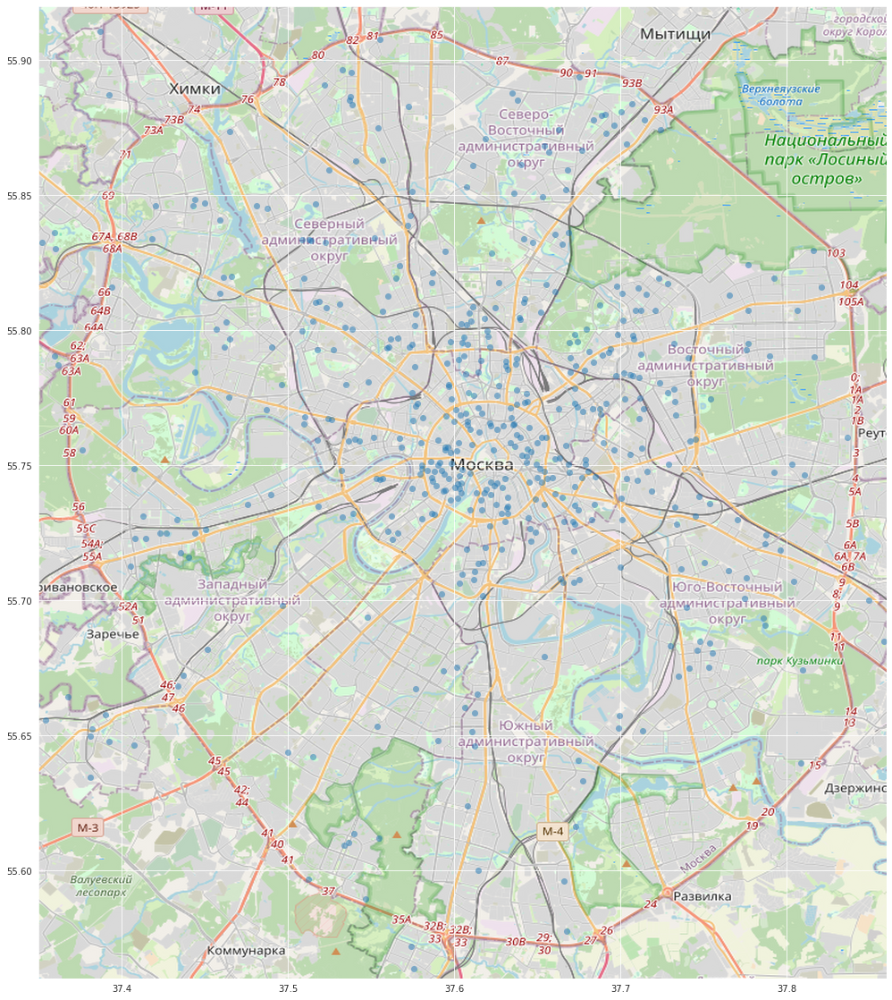

In [20]:
grouped_df = rest_df.groupby('street')\
                .agg(n_point=('id', 'count'), district=('district', 'first'), lat = ('lat', 'first'), long = ('long', 'first'))\
                .reset_index()

show_html_tag('h4', 'Список улиц с одним заведением')
display(grouped_df.query('n_point == 1'))
one_point_in_street_district = grouped_df.query('n_point == 1').groupby('district').agg(count=('street', 'count'))\
                                                                                    .sort_values('count', ascending = False)
show_html_tag('h4', 'Список районов, в которых находятся улицы с одним заведением')
display(one_point_in_street_district)
show_map(data = grouped_df.query('n_point == 1'))

#### Вывод
* На 543 улицах есть всего одно заведение общепита
* Эти улицы расположены в 101 районе. Больше всего их в Таганском, Хамовниках, Басманном, Пресненском и Тверском районах.
* По карте можно заметить, что такие улицы тяготеют к центру.
* Данный блок вообще считаю лишённым смысла в нынешнем виде. Знание таких улиц нам ничего не даёт без дополнительного анализа. Но попросили - сделал.

<a id="2.9"></a>
### Распределение количества посадочных мест для улиц с большим количеством объектов общественного питания.

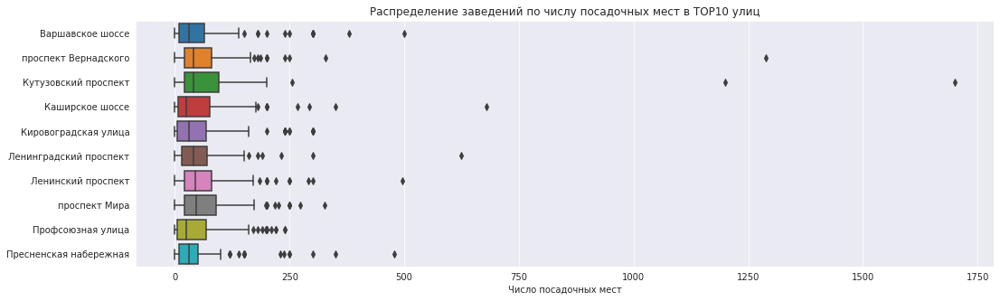

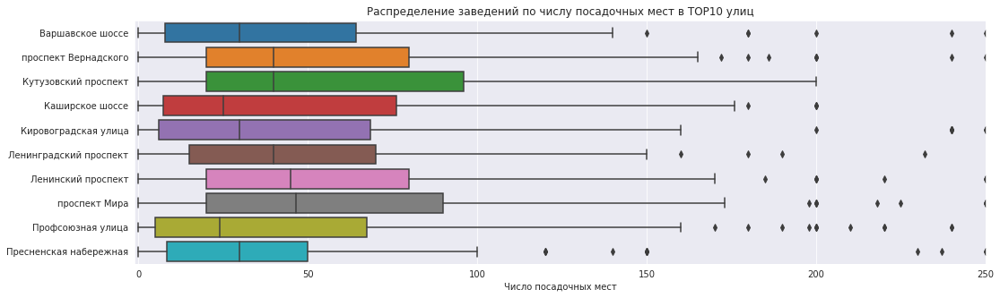

,mean,median
street,,
Пресненская набережная,39.80,28.50
Варшавское шоссе,41.33,27.50
Каширское шоссе,42.42,24.50
Профсоюзная улица,47.36,24.00
Ленинградский проспект,47.47,40.00
Кировоградская улица,50.73,26.00
проспект Вернадского,55.57,40.00
Ленинский проспект,56.97,43.00
Кутузовский проспект,58.94,40.00


In [21]:
grouped_df = rest_df.groupby('street').agg(n_point=('id', 'count')).nlargest(12, 'n_point').reset_index()
# отбросим пригород 
bad_street = ['город Зеленоград', 'поселение Сосенское']
street_list = grouped_df.query('street not in @bad_street')['street'].to_list()

rest_in_top10_street_df = rest_df.query('street in @street_list').filter(['street', 'number'])
    
    
boxplot_h( df = rest_in_top10_street_df, x='number', y='street', xlabel = 'Число посадочных мест', 
                        title = 'Распределение заведений по числу посадочных мест в TOP10 улиц' )
show_html_tag('h4', 'Увеличим масштаб')
boxplot_h( df = rest_in_top10_street_df, x='number', y='street', xlim = (-1, 250), xlabel = 'Число посадочных мест', 
                        title = 'Распределение заведений по числу посадочных мест в TOP10 улиц' )

# отсёчём выбросы более 250
display(rest_in_top10_street_df.query('number <= 250').groupby('street')\
                                .agg(mean=('number', 'mean'), median = ('number', 'median')).sort_values('mean'))




#### Вывод
* В среднем, самые крупные заведения на проспектах Мира, Ленинском и Кутузовском (в среднем, 57-60 посадочных мест).
* Самые мелкие на Пресненской набережной и Каширским с Варшавским шоссе (в среднем, 40-43 посадочных места)

## Общие выводы
* На анализ представлен файл, содержащий 15366 записей о заведениях общественного питания Москвы внутри МКАД и за пределами МКАД
* 12398 являются самостоятельными заведениями, 2968 сетевыми, распределёнными по 319 сетям. Число сетей определено приблизительно из-за погрешностей в наименованиях заведений.
* Наиболее распространённый тип заведений - кафе (6099 шт, 40%), что более чем в 2 раза превышает число столовых (2587 шт, 17%), которые на втором месте по популярности.
* Самые редкие - отделы кулинарии в магазинах (273 шт, 1.8%) и закусочные (360 шт, 2.3%).
* Сетевой вид распространения наиболее характерен среди предприятий быстрого обслуживания (41%) и отделов кулинарии в магазинах (28%)
* Реже всего сетевые заведения встречаются среди среди столовых (0.1%) и буфетов (менее 2%).
* Типичная сеть имеет небольшое число точек (менее 25) и менее 150 посадочных мест в одной точке.
* Лидерами по числу посадочных мест в одной точке являются столовые и рестораны, а аутсайдеры отделы кулинарии и закусочные.
* Топовые улицы по числу заведений: Проспект Мира (204), Профсоюзная улица (183) и Ленинградский проспект(173).
* На 543 улицах расположено всего по одному объекту общепита.
* В среднем, самые крупные заведения на проспектах Мира, Ленинском и Кутузовском (в среднем, 57-60 посадочных мест)

## Рекомендации
* Вариант размещения первых объектов за пределами МКАД лучше не рассматривать и на это несколько причин:
 * эффект экзотики притупляется у постоянных посетителей, а в центре больше туристов, которым будет интеерсно заглянуть хотя бы один раз в робокафе.
 * публика в центре в среднем более состоятельная, чем в замкадье (исключая элитные посёлки, но там низкая проходимость)
* Ориентироваться на большие заведения не стоит. "Мудрость толпы" подсказывает, что наиболее популярны заведения с небольшим числом посадочных мест (медиана менее 50). ДОполнительный плюс такого формата - отыскать помещение на 50 мест гораздо проще, чем на 1000+.
* Формат заведения: кафе. Вероятнее всего это обусловленно тем, что под видом кафе можно запустить практически любое заведение.
* Вероятность развить большую сеть небольшая, на это есть ресурсы только у очень сильных брендов типа KFC, Шоколадница, Макдональдс. Подавляющее число сетей имеет менее 25 (скорее даже менее 10) заведений.

In [22]:
# В данном блоке расположен код, который на этапе ревью не выполняется.
# С помощью вызова generate_district_df() выгружается district.csv,
# который содержит три колонки (на самом деле четыре, но четвёртая несущественная для анализа): 
# уникальный адрес | район | coord
# Время выполнения при запуске на сервере ЯП - 40 минут. Используется только requests без высокоуровных библиотек
# Важно! К моменту запуска generate_district_df(), rest_df должен быть загружен из исходного файла.

# 358 адресов не распознаются, но в основном это адреса прямо на МКАДе или уже за МКАДом. Не стал с ними возиться,
# т.к. и число малое и расположение не интересное.

# После генерации я скачал файлик и залил его на свой сервер. И потом загружаю ужё оттуда в начале проекта


BASE_URL = 'https://geocode-maps.yandex.ru/1.x/' 
api_key = 'e582fb1b-f660-426f-985b-e553d9bfcd8a'

def get_region_by_address(row):
    """с помощью яндексовского геокодера для каждого адреса сначала определяем его координаты, а по координатам потом район"""
    address = row['address']
    
    if row.name % 100 == 0: # выводим прогресс
        print(row.name)
    
    params1 = { 
            'apikey' : api_key,
            'format' : 'json',
            'results': '1', #достаточно одного результата
            'geocode': address,
            'rspn': '1', # ограничиваем зону поиска
            'll': '37.617777778,55.755833333', # центр Москвы
            'spn': '3,2'                # ограничиваемся прямоугольником 3х2 градуса
        }

    try: # чтобы не упасть при проблеме с распознованием адреса
        response = requests.get(BASE_URL, params=params1)

        params2 = { 
                'apikey' : api_key,
                'format' : 'json',
                'results': '1', #достаточно одного результата
                'kind': "district", # нужен объект типа district
                'geocode': '',
            }

        # из json вытаскиваем координаты объекта
        params2['geocode'] = json.loads(response.text)\
                                ['response']['GeoObjectCollection']['featureMember'][0]['GeoObject']['Point']['pos']

        # по координатам определяем район
        response = requests.get(BASE_URL, params=params2)
        json_components = json.loads(response.text)['response']['GeoObjectCollection']['featureMember'][0]\
                                        ['GeoObject']['metaDataProperty']['GeocoderMetaData']['Address']['Components']
        # в компоненте куча разных объектов может быть. нам нужен district в имени которого есть "район" 
        # округа - это тоже дистрикты. но нам они не нужны
        for component in json_components:
            if component['kind'] == 'district' and component['name'].find('район') != -1:
                return component['name'], params2['geocode']
    except Exception: # с распознованием адреса проблема. выведем его для мониторинга и вернём None
        print(row)
        return None, None

def generate_district_df():
    """процедура для создания csv со связкой уникальный адрес - район - координаты"""
    unic_address_df = rest_df.groupby('address').agg(count=('id', 'count')).reset_index()
    print('Число уникальных адресов: {}'.format(len(unic_address_df)))

    unic_address_df[['district', 'coord'] ] = unic_address_df.apply(get_region_by_address, axis = 1, result_type = 'expand')

    print('All OK!')
    display(unic_address_df)
    unic_address_df.to_csv('district.csv')
    
# generate_district_df()